In [1]:
# import module
import tensorflow as tf
import numpy as np
import os
import io
import time

#Define Token
START_ID = 0 #시퀀스 시작 토큰 ID
PAD_ID = 1   #시퀀스 공백 토큰 ID
END_ID = 2   #시퀀스 종결 토큰 ID

#Parameter
#입력 최대 길이
ENC_MAX_STEP = 10
#Label 최대 길이
DATA_MAX_OUTPUT = 4

DATA_PATH = "./data/convex_hull_5_test.txt"
PREFIX = "thermo"
#Label + End Token 최대 길이 
DEC_MAX_STEP = DATA_MAX_OUTPUT + 1 #max output lengths

BATCH_SIZE = 32
EPOCHS = 100
UNITS = 256
LEARNING_RATE = 0.001
BEAM_WIDTH = 4
OUTPUT_STD = None
DROPOUT_RATE = 0.0
#graident Clipping 파라미터
CLIPPING_VALUE = None
TRAIN_DATA_RATIO = 0.9

In [2]:
import filter_utils

input_folder = "./image/"
output_folder = "./filtered_images/"

filter_utils.process_images(input_folder, output_folder)

dir_path = './filtered_images/'
filtered_image_names = filter_utils.get_filtered_image_names(dir_path)
print(filtered_image_names)

이미지 처리 완료
['0106', '0161', '0209', '0221', '0341', '0345', '0353', '0544', '0561', '0614', '0660', '0662', '0734', '0768', '0789', '0883', '0896', '0928', '0953', '0966', '1004', '1015', '1085', '1244', '1307', '1408', '1439', '1445', '1480', '1606', '1663', '1679', '1770', '1773', '1785', '1801', '1811', '1826', '1891', '1919', '2001', '2016', '2055', '2097', '2143', '2179', '2203', '2212', '2222', '2288', '2363', '2380', '2381', '2591', '2630', '2645', '2660', '2821', '2835', '2840', '3039', '3121', '3125', '3131', '3149', '3258', '3317', '3343', '3490', '3580', '3734', '3806', '3814', '3816', '3832', '3855', '3885', '3907', '3917', '3932', '4007', '4016', '4121', '4188', '4265', '4366', '4436', '4462', '4465', '4486', '4499', '4527', '4580', '4593', '4637', '4826', '4837', '4874', '4891', '4914', '5090', '5211', '5239', '5250', '5270', '5271', '5281', '5350', '5358', '5359', '5403', '5537', '5569', '5657', '5725', '5745', '5928', '5991', '5993', '6028', '6072', '6111', '6157', '6193

In [3]:
import data_preprocessing

dir_path = './filtered_images/'
file_list = [file_name for file_name in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, file_name))]

dataname = []
for file_name in file_list:
    data_name, extension = os.path.splitext(file_name)
    dataname.append(data_name)

print("데이터 크기 : ", len(dataname))
img_folder = "./filtered_images/"
json_folder = "./221204/"

#이미지 전처리
data_x, original_imgs = data_preprocessing.preprocess_images(dataname, img_folder, json_folder)

#Label 생성
data_y = data_preprocessing.generate_labels(dataname)

# 결과 확인
for i in range(2):
    print(f"data_x[{i}].shape:", data_x[i].shape)  # (버튼 개수, 높이, 너비, 채널)
    print(f"data_y[{i}]:", data_y[i])


데이터 크기 :  199
data_x[0].shape: (10, 40, 50, 1)
data_y[0]: [1 2 1 7 0]
data_x[1].shape: (10, 40, 50, 1)
data_y[1]: [1 2 7 2 0]


In [4]:
import data_splitter



# 데이터 분리
train_inputs, train_labels, train_orig, val_inputs, val_labels, val_orig = data_splitter.split_train_val(data_x, 
                                                                                                         data_y, 
                                                                                                         original_imgs, 
                                                                                                         val_size=len(data_x)//10)


print(train_inputs.shape)
print(train_labels.shape)
print(val_inputs.shape)
print(val_labels.shape)

STEPS_PER_EPOCH = train_inputs.shape[0] // BATCH_SIZE
print(STEPS_PER_EPOCH)

(180, 10, 40, 50, 1)
(180, 5)
(19, 10, 40, 50, 1)
(19, 5)
5


In [ ]:
'''
# 데이터 증강
import augment_images

shifts = [(0, 0),
         (2, 2), (2, -2), (-2, 2), (-2, -2),
         (8, 0), (8, 0), (0, 8), (0, -8),
         (4, 4), (4, -4), (-4, 4), (-4, -4),
         (12, 0), (-12, 0), (0, 12), (0, -12)]

rotates = [0, 2, -2, 5, -5, 10, -10, 15, -15]

cut = np.zeros(len(data_x), dtype=bool)

train_inputs, train_labels = augment_images.augment_images(dataname, file_list, cut, shifts, rotates)
train_orig = original_imgs

train_inputs = np.expand_dims(train_inputs, axis=-1)  # grayscale 이미지라 channel이 1이니까 확장해줌
print(train_inputs.shape)
print(train_labels.shape)
'''

In [5]:
import batcher
import attention_models
import pointer_network


In [6]:
#확인용

train_batcher = batcher.Batcher(train_inputs, train_labels, randomize=True)

inp, targ = train_batcher.get_batch(32)

print(inp.shape)
print(targ.shape)

train_batcher.reset_random()

print(train_inputs.shape)
print(train_labels.shape)

print(val_inputs.shape)
print(val_labels.shape)

(32, 10, 40, 50, 1)
(32, 5)
(180, 10, 40, 50, 1)
(180, 5)
(19, 10, 40, 50, 1)
(19, 5)


# 학습된 데이터를 기반으로 비밀번호 예측해보기
# YOLOv5로 객체 탐지 - PN 모델로 비밀번호 예측 순
# PN 선언하고 돌려야 합니다.

In [12]:
import torch
import cv2
from pathlib import Path

# Set YOLOv5 path
yolov5_path = Path('/yolov5')
model_path = 'best.pt'

# Load YOLOv5 model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_path)
model.to(device)

# 이미지 경로 설정
img_path = '5350.jpg'

# 가중치를 활용해 
results = model(img_path)

# label명이 Password인 레이블 추출
password_results_df = results.pandas().xyxy[0][results.pandas().xyxy[0]['name'] == 'Password']

# Modify the internal detections data with Password label only
print(password_results_df)


Using cache found in C:\Users\yongg/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-3-24 Python-3.9.16 torch-2.0.0+cpu CPU

Fusing layers... 
Model summary: 166 layers, 7056607 parameters, 0 gradients
Adding AutoShape... 


        xmin        ymin        xmax         ymax  confidence  class      name
0  142.57872  760.480652  427.071533  1171.980225    0.909238      0  Password


In [13]:
image = cv2.imread(img_path)
filtered_img = filter_utils.apply_new_filters(image) #전체 이미지에 대해 필터 적용

xmin, ymin, xmax, ymax = password_results_df.iloc[0][['xmin', 'ymin', 'xmax', 'ymax']]
xmin, ymin, xmax, ymax = int(xmin), int(ymin), int(xmax), int(ymax)
cropped_image = filtered_img[ymin:ymax, xmin:xmax] #필터 적용 후 자름
cv2.imwrite("cropped_password.jpg", cropped_image)

type(cropped_image)

numpy.ndarray

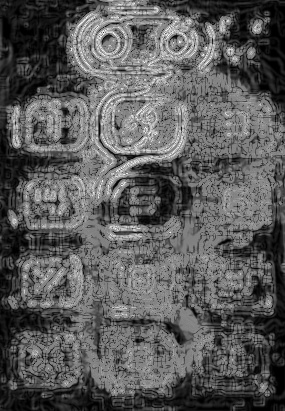

In [14]:
from IPython.display import Image
Image(filename='cropped_password.jpg')
#출력 확인

In [15]:
import filter_utils
import data_preprocessing
import data_splitter

In [16]:
preprocessed_img = data_preprocessing.preprocess_evaluating_image(cropped_image)
preprocessed_img = np.expand_dims(preprocessed_img, axis=0) 
print(preprocessed_img.shape)
inp, targ = preprocessed_img, np.zeros((preprocessed_img.shape[0],DEC_MAX_STEP), dtype=np.int32)
#target은 없으니까 dummy값을 넣어줌. None은 안 됨
result = PN.predict(inp, targ)
predictions = result[0]
password_prediction = (predictions.numpy().squeeze()[:-1] - 1).tolist()  #종결토큰무시
password_string = ''.join(map(str, password_prediction))
print(predictions)
print("비밀번호 예측값:", password_string)

(1, 10, 40, 50, 1)
tf.Tensor(
[[[1]
  [6]
  [6]
  [1]
  [0]]], shape=(1, 5, 1), dtype=int64)
비밀번호 예측값: 0550




### 인코더와 디코더는 기본적으로 LSTM 모델을 사용한다.

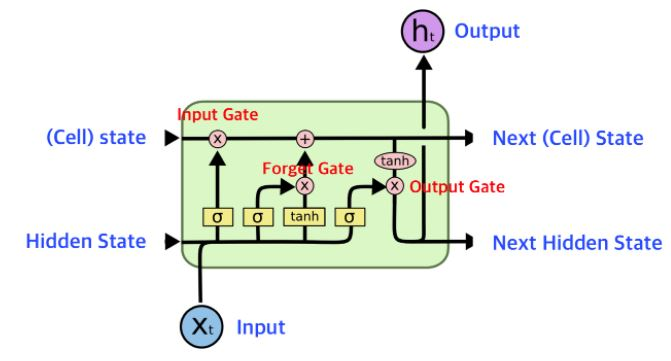

LSTM은 h와 c 두 개의 은닉 상태를 가진다.
* h: 단기 기억(이자 출력)
* c: 장기 기억


# Pointer Network 및 체크포인트 선언, 학습된 값 복원, 실험 코드

In [7]:
PN = pointer_network.PointerNetwork(UNITS, BATCH_SIZE,
                    learning_rate=LEARNING_RATE,
                    output_std=0.1,
                    dropout_rate=DROPOUT_RATE)


checkpoint_dir = "./training_checkpoints/pn" + PREFIX
checkpoint_prefix = os.path.join(checkpoint_dir, "pn")
checkpoint = tf.train.Checkpoint(**PN.get_model())

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

#val_labels = np.expand_dims(val_labels, axis=-1)  # 차원 추가
#val_labels = np.tile(val_labels, [1, 10, 1])  # (18, 10, 1)로 변환
(predictions, acc) =  PN.eval(val_inputs[:1], val_labels[:1])


print("예측 id: ")
for i in range( predictions.shape[1]):
    print(predictions[0,i,0].numpy(), "", end="")
print()
print("정답 id: ")
for i in range(val_labels.shape[1]):
    print(val_labels[0,i], "", end="")

예측 id: 
0 0 0 0 0 
정답 id: 
1 3 3 2 0 

In [ ]:
print(train_inputs.shape)
print(train_labels.shape)

print(val_inputs.shape)
print(val_labels.shape)

# 검증 코드

In [8]:
import matplotlib.pyplot as plt

def array_similarity(arr1, arr2): ## 배열 유사도
    assert len(arr1) == len(arr2)

    match_count = 0
    length = len(arr1)
    for i in range(length):
        if arr1[i] == arr2[i]:
            match_count += 1

    return match_count / length


def validation_print(k=3, N=1, show_img=False):
    acc = 0.0
    total_similarity = 0.0

    inp, lab = val_inputs, val_labels

    for n_samples in range(N):
        result, n_samples = PN.eval(inp, lab)
        #top_k_probs, top_k_indices = top_k_predictions(PN, inp, k=k)
        acc += n_samples
    
        acc = acc / N
        print("Evaluation: ")
        print("acc: ", acc)

        for i in range(val_inputs.shape[0]):
            pred_arr = [result[i, j, 0] - 1 for j in range(result.shape[1])]
            targ_arr = [lab[i, j] - 1 for j in range(DEC_MAX_STEP)]

            similarity = array_similarity(pred_arr, targ_arr)
            total_similarity += similarity

            if show_img:
                plt.imshow(val_orig[i])
                plt.show()

            print("=====================sample {0}=====================".format(i + 1))

            r_str = "pred: [{}]".format(" ".join("{:^3}".format(x) for x in pred_arr))
            t_str = "targ: [{}]".format(" ".join("{:^3}".format(x) for x in targ_arr))
            s_str = "배열 유사도: {:.2f}".format(similarity)


            print(r_str)
            print(t_str)
            print(s_str)

            

    avg_similarity = total_similarity / (val_inputs.shape[0] * N)
    #acc = acc / (val_inputs.shape[0] * N)

    #print("\nacc: ", acc)
    print("배열 유사도 평균치: {:.2f}".format(avg_similarity))
    print("----------------------------------")

    return acc


## 검증

Evaluation: 
acc:  0.0


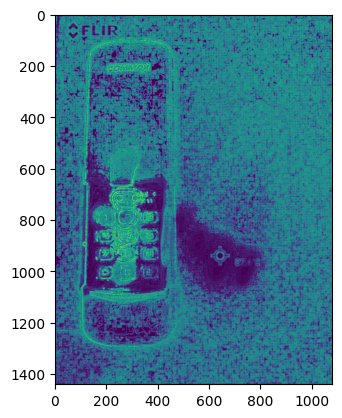

=====================sample 1=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 0   2   2   1  -1 ]
배열 유사도: 0.20


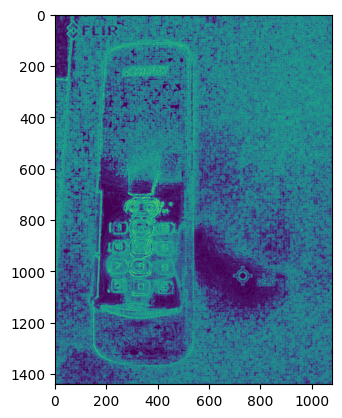

=====================sample 2=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 0   7   8   9  -1 ]
배열 유사도: 0.20


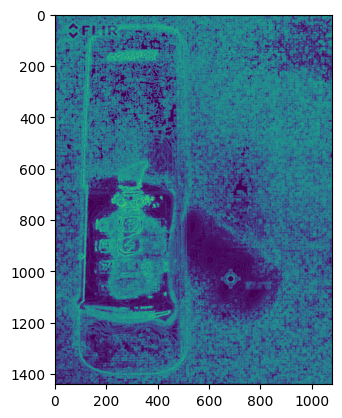

=====================sample 3=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 2   0   5   5  -1 ]
배열 유사도: 0.20


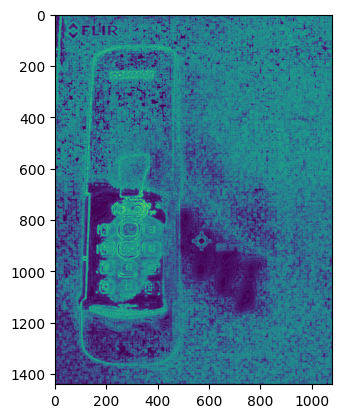

=====================sample 4=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 2   3   8   0  -1 ]
배열 유사도: 0.20


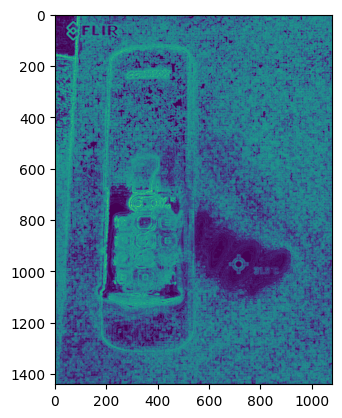

=====================sample 5=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 2   6   3   0  -1 ]
배열 유사도: 0.20


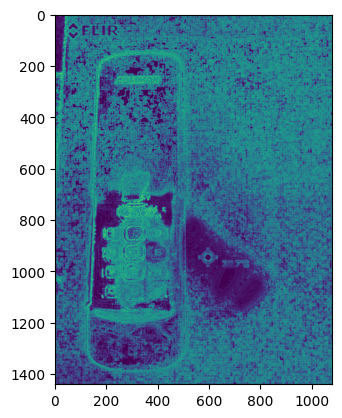

=====================sample 6=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 2   6   6   0  -1 ]
배열 유사도: 0.20


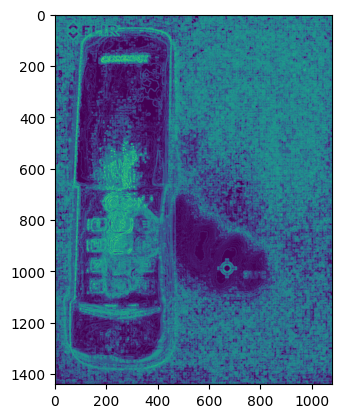

=====================sample 7=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 3   8   0   6  -1 ]
배열 유사도: 0.20


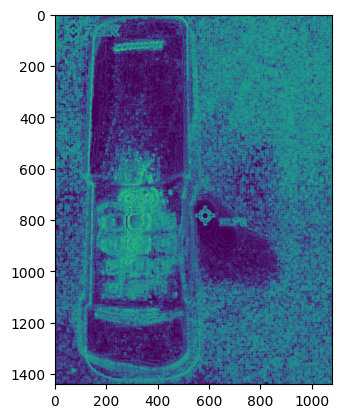

=====================sample 8=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 4   1   2   1  -1 ]
배열 유사도: 0.20


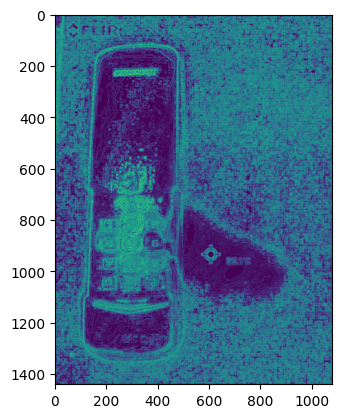

=====================sample 9=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 4   3   6   6  -1 ]
배열 유사도: 0.20


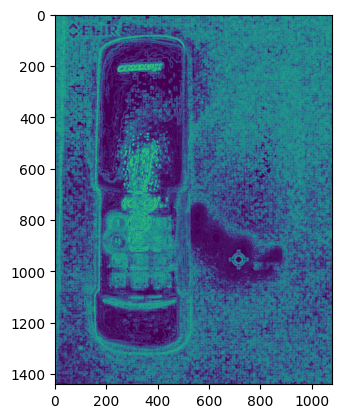

=====================sample 10=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 4   9   1   4  -1 ]
배열 유사도: 0.20


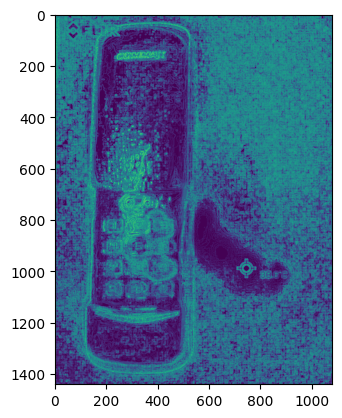

=====================sample 11=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 5   3   5   9  -1 ]
배열 유사도: 0.20


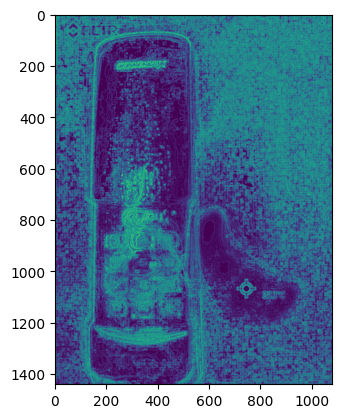

=====================sample 12=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 5   7   2   5  -1 ]
배열 유사도: 0.20


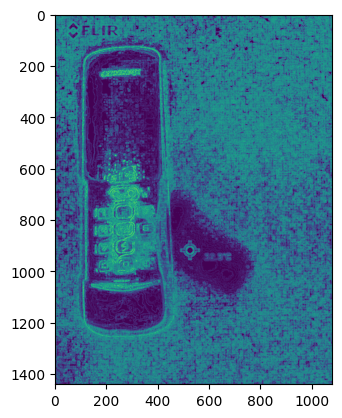

=====================sample 13=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 6   0   2   8  -1 ]
배열 유사도: 0.20


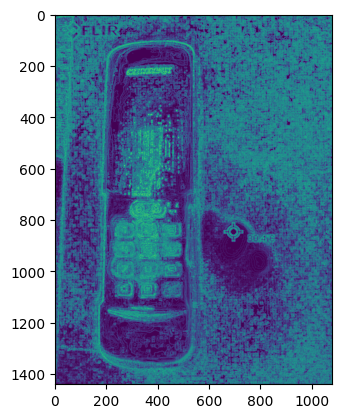

=====================sample 14=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 7   8   4   1  -1 ]
배열 유사도: 0.20


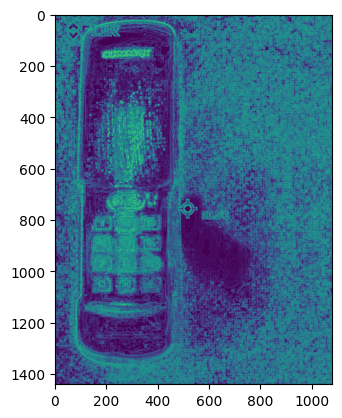

=====================sample 15=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 7   9   2   4  -1 ]
배열 유사도: 0.20


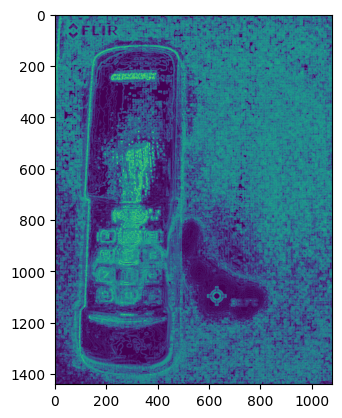

=====================sample 16=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 8   0   6   7  -1 ]
배열 유사도: 0.20


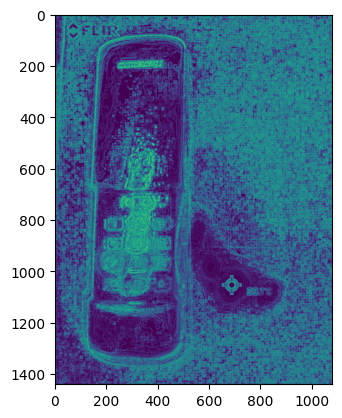

=====================sample 17=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 8   0   7   0  -1 ]
배열 유사도: 0.20


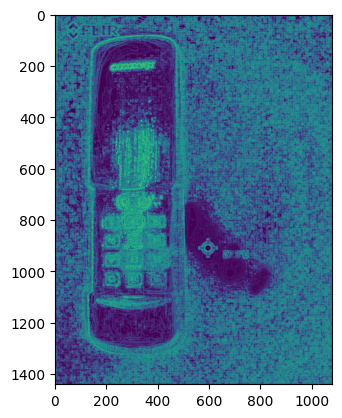

=====================sample 18=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 8   9   1   9  -1 ]
배열 유사도: 0.20


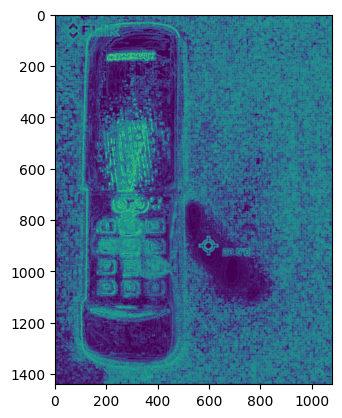

=====================sample 19=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 9   4   2   5  -1 ]
배열 유사도: 0.20
배열 유사도 평균치: 0.20
----------------------------------


0.0

In [9]:
validation_print(show_img=True)

In [10]:
#학습하기
for epoch in range(100):
    start = time.time()
    total_loss = 0
    rand_idx = np.arange(train_inputs.shape[0])

    np.random.shuffle(rand_idx)
    
    for batch in range(STEPS_PER_EPOCH):
      
        inp, targ = train_batcher.get_batch(BATCH_SIZE)

        batch_loss = PN.step(inp, targ, clipping_value = CLIPPING_VALUE)
        total_loss += batch_loss

        if batch % 100 == 0:
            print('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1,
                                                         batch,
                                                             batch_loss.numpy()))
        #if batch % 1000 == 0:
    #if (epoch+1)%10 == 0:
      #validation_print()

    # saving (checkpoint) the model every 2 epochs
    checkpoint.save(file_prefix = checkpoint_prefix)

    print('Epoch {} Loss {:.4f}'.format(epoch + 1,
                                        total_loss/ STEPS_PER_EPOCH))
    print('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    

Epoch 1 Batch 0 Loss 2.3710
Epoch 1 Loss 2.5515
Time taken for 1 epoch 4.334844350814819 sec

Epoch 2 Batch 0 Loss 2.3608
Epoch 2 Loss 2.3188
Time taken for 1 epoch 0.34930872917175293 sec

Epoch 3 Batch 0 Loss 2.2757
Epoch 3 Loss 2.2178
Time taken for 1 epoch 0.3460872173309326 sec

Epoch 4 Batch 0 Loss 2.1229
Epoch 4 Loss 2.0435
Time taken for 1 epoch 0.35300111770629883 sec

Epoch 5 Batch 0 Loss 1.9535
Epoch 5 Loss 1.9196
Time taken for 1 epoch 0.3478708267211914 sec

Epoch 6 Batch 0 Loss 1.8809
Epoch 6 Loss 1.8688
Time taken for 1 epoch 0.3503749370574951 sec

Epoch 7 Batch 0 Loss 1.8443
Epoch 7 Loss 1.8423
Time taken for 1 epoch 0.3579905033111572 sec

Epoch 8 Batch 0 Loss 1.8607
Epoch 8 Loss 1.8393
Time taken for 1 epoch 0.3479006290435791 sec

Epoch 9 Batch 0 Loss 1.8265
Epoch 9 Loss 1.8293
Time taken for 1 epoch 0.3475830554962158 sec

Epoch 10 Batch 0 Loss 1.8150
Epoch 10 Loss 1.8167
Time taken for 1 epoch 0.34583210945129395 sec

Epoch 11 Batch 0 Loss 1.8026
Epoch 11 Loss 1.7

Epoch 85 Loss 0.8555
Time taken for 1 epoch 0.3780961036682129 sec

Epoch 86 Batch 0 Loss 0.8649
Epoch 86 Loss 0.8259
Time taken for 1 epoch 0.4036428928375244 sec

Epoch 87 Batch 0 Loss 0.9142
Epoch 87 Loss 0.8386
Time taken for 1 epoch 0.41044139862060547 sec

Epoch 88 Batch 0 Loss 0.9260
Epoch 88 Loss 0.8477
Time taken for 1 epoch 0.3966193199157715 sec

Epoch 89 Batch 0 Loss 0.7872
Epoch 89 Loss 0.8105
Time taken for 1 epoch 0.37453389167785645 sec

Epoch 90 Batch 0 Loss 0.7986
Epoch 90 Loss 0.8026
Time taken for 1 epoch 0.4290304183959961 sec

Epoch 91 Batch 0 Loss 0.7361
Epoch 91 Loss 0.8036
Time taken for 1 epoch 0.41240859031677246 sec

Epoch 92 Batch 0 Loss 0.7758
Epoch 92 Loss 0.7615
Time taken for 1 epoch 0.3797743320465088 sec

Epoch 93 Batch 0 Loss 0.7172
Epoch 93 Loss 0.7275
Time taken for 1 epoch 0.3678300380706787 sec

Epoch 94 Batch 0 Loss 0.7919
Epoch 94 Loss 0.7358
Time taken for 1 epoch 0.3951437473297119 sec

Epoch 95 Batch 0 Loss 0.6676
Epoch 95 Loss 0.7007
Time t

Evaluation: 
acc:  0.0


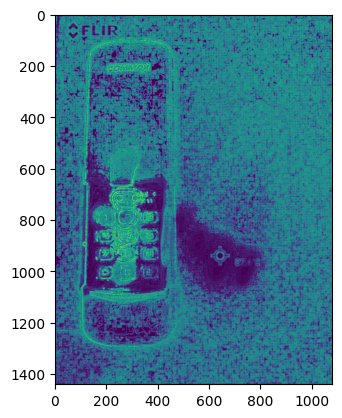

=====================sample 1=====================
pred: [ 2   2   2   2  -1 ]
targ: [ 0   2   2   1  -1 ]
배열 유사도: 0.60


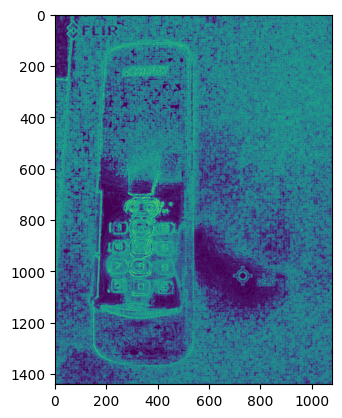

=====================sample 2=====================
pred: [ 0   8   7   7  -1 ]
targ: [ 0   7   8   9  -1 ]
배열 유사도: 0.40


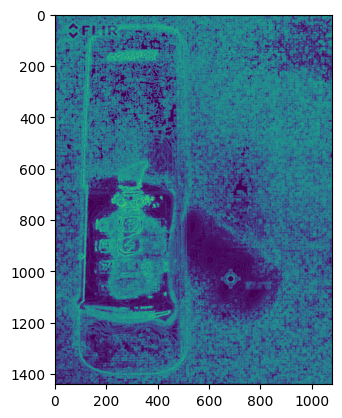

=====================sample 3=====================
pred: [ 5   5   5   0  -1 ]
targ: [ 2   0   5   5  -1 ]
배열 유사도: 0.40


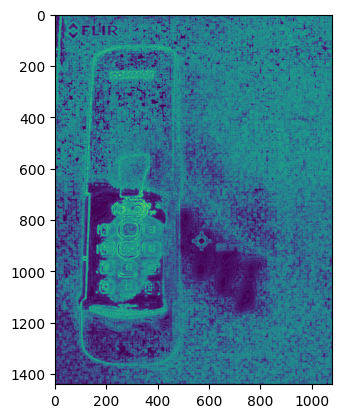

=====================sample 4=====================
pred: [ 2   8   8   2  -1 ]
targ: [ 2   3   8   0  -1 ]
배열 유사도: 0.60


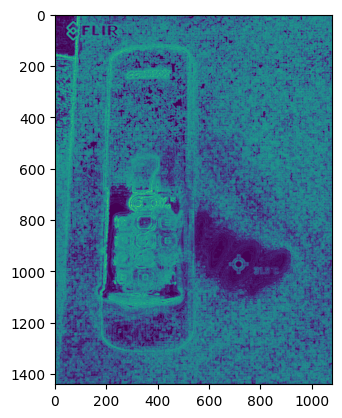

=====================sample 5=====================
pred: [ 2   2   2   2  -1 ]
targ: [ 2   6   3   0  -1 ]
배열 유사도: 0.40


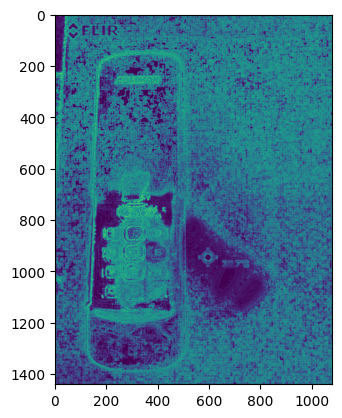

=====================sample 6=====================
pred: [ 2   6   2   2  -1 ]
targ: [ 2   6   6   0  -1 ]
배열 유사도: 0.60


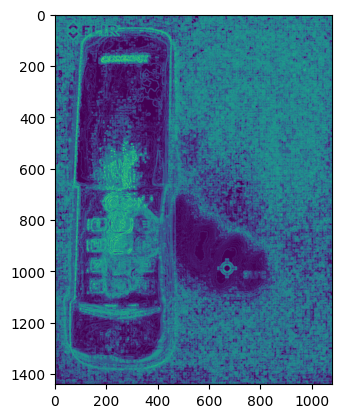

=====================sample 7=====================
pred: [ 3   8   8   6  -1 ]
targ: [ 3   8   0   6  -1 ]
배열 유사도: 0.80


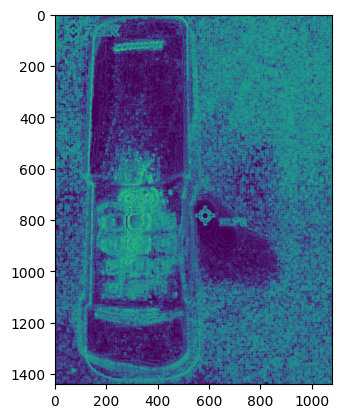

=====================sample 8=====================
pred: [ 4   1   1   2  -1 ]
targ: [ 4   1   2   1  -1 ]
배열 유사도: 0.60


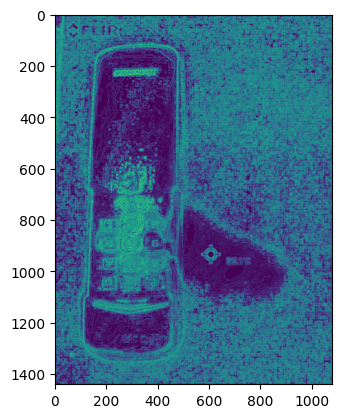

=====================sample 9=====================
pred: [ 6   6   6   3  -1 ]
targ: [ 4   3   6   6  -1 ]
배열 유사도: 0.40


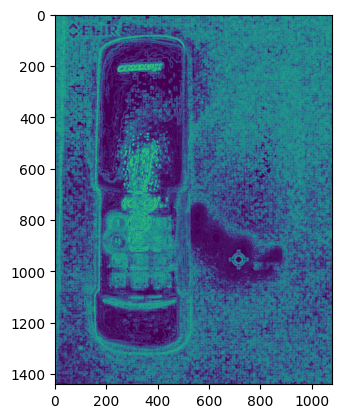

=====================sample 10=====================
pred: [ 4   9   1   9  -1 ]
targ: [ 4   9   1   4  -1 ]
배열 유사도: 0.80


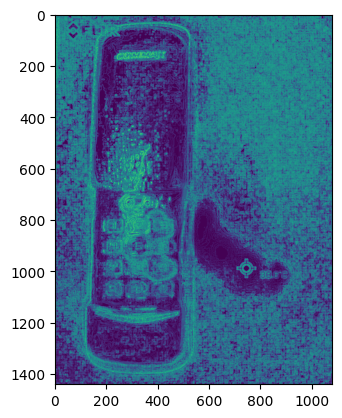

=====================sample 11=====================
pred: [ 5   5   9   9  -1 ]
targ: [ 5   3   5   9  -1 ]
배열 유사도: 0.60


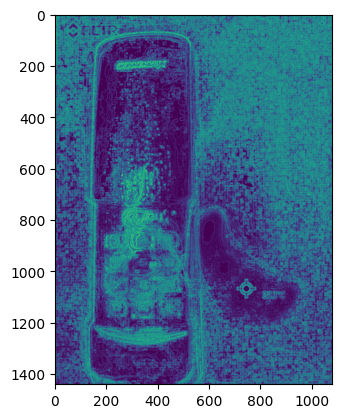

=====================sample 12=====================
pred: [ 7   2   7   7  -1 ]
targ: [ 5   7   2   5  -1 ]
배열 유사도: 0.20


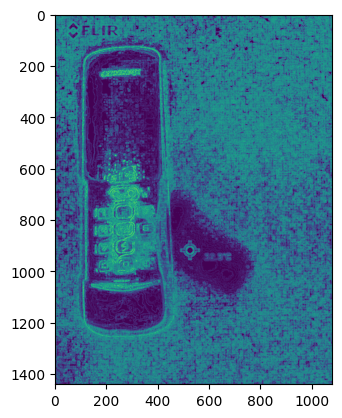

=====================sample 13=====================
pred: [ 6   8   2   6  -1 ]
targ: [ 6   0   2   8  -1 ]
배열 유사도: 0.60


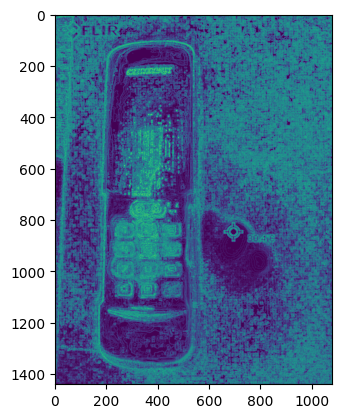

=====================sample 14=====================
pred: [ 7   4   7   1  -1 ]
targ: [ 7   8   4   1  -1 ]
배열 유사도: 0.60


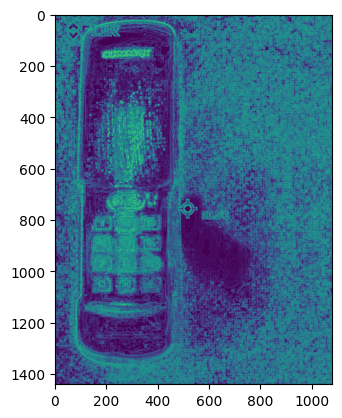

=====================sample 15=====================
pred: [ 9   7   4   4  -1 ]
targ: [ 7   9   2   4  -1 ]
배열 유사도: 0.40


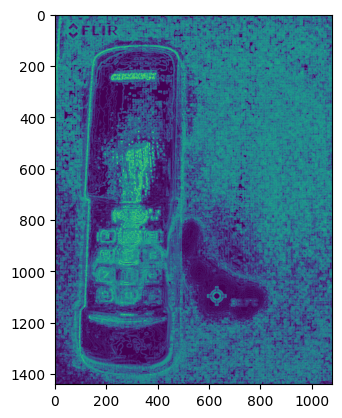

=====================sample 16=====================
pred: [ 6   4   7   7  -1 ]
targ: [ 8   0   6   7  -1 ]
배열 유사도: 0.40


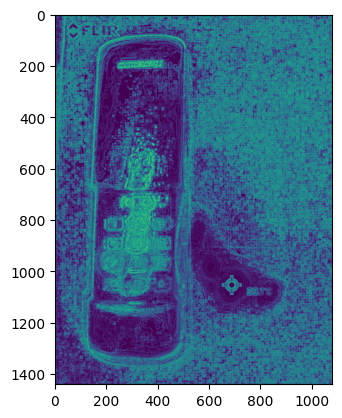

=====================sample 17=====================
pred: [ 7   8   0   0  -1 ]
targ: [ 8   0   7   0  -1 ]
배열 유사도: 0.40


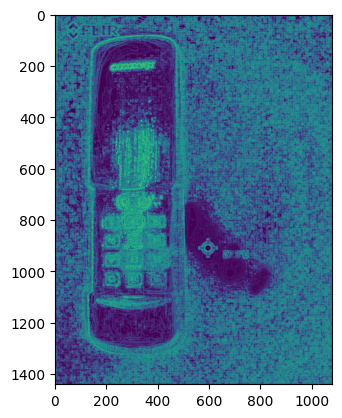

=====================sample 18=====================
pred: [ 9   9   1   9  -1 ]
targ: [ 8   9   1   9  -1 ]
배열 유사도: 0.80


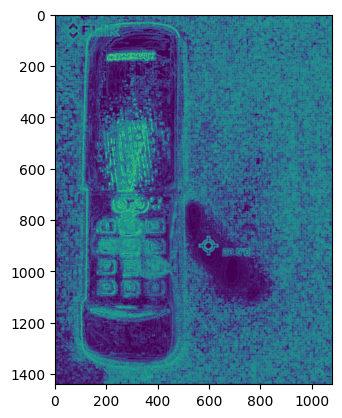

=====================sample 19=====================
pred: [ 9   4   9   4  -1 ]
targ: [ 9   4   2   5  -1 ]
배열 유사도: 0.60
배열 유사도 평균치: 0.54
----------------------------------


0.0

In [11]:
#검증
validation_print(show_img=True)

# Convex hull 그리기

In [ ]:
import matplotlib.pyplot as plt

def plot_convex_hull(inp, targ, pred):

  fig = plt.figure(figsize=[12, 6])

  ax = plt.subplot(1, 2, 1)

  plt.scatter(inp[:, 0], inp[:, 1])

  for mx in range(0, targ.shape[0]):
    if targ[mx] == 0:
      break;

  plt.plot(inp[targ[:mx]-1, 0], inp[targ[:mx]-1, 1])

  plt.gca().invert_yaxis()
  plt.axis("off")

  plt.title("Label")

  ax = plt.subplot(1, 2, 2)

  plt.scatter(inp[:, 0], inp[:, 1])

  for mx in range(0, pred.shape[0]):
    if pred[mx] <= 0:
      break;

  plt.plot(inp[pred[:mx]-1, 0], inp[pred[ :mx]-1, 1])

  plt.gca().invert_yaxis()
  plt.axis("off")

  plt.title("Prediction")


In [ ]:
#draw convex hull

n_samples = 10

predictions, _ = PN.eval(val_inputs[:n_samples], val_labels[:n_samples])

for i in range(n_samples):
  plot_convex_hull(val_inputs[i], val_labels[i], predictions[i])